In [1]:
#!for a in /sys/bus/pci/devices/*; do echo 0 | sudo tee -a $a/numa_node; done
import tensorflow as tf
import matplotlib.pyplot as plt
import os
from data_processing import dataset
from models import model
from utils import tools
from plots import plots, edge_detection_plots

os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'
#np.set_printoptions(threshold=sys.maxsize)

2023-01-26 10:28:09.344244: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-01-26 10:28:09.436880: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-01-26 10:28:09.458459: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-01-26 10:28:09.856886: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

In [2]:
config_directory = 'segmentation'

config_path = os.path.join(os.getcwd(), 'configs', config_directory)
DataProcessing = dataset.DataProcessing(config_path=config_path)
Model = model.Model(config_path)
tools.parser(Model.cfg, DataProcessing.cfg)
Model.load_data(DataProcessing.cfg["NAME"])
DataProcessing.path_definitions()

2023-01-26 10:28:10.961663: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-26 10:28:10.965137: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-26 10:28:10.965241: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-26 10:28:10.965877: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the approp

# Load Dataset, Preprocess Images and Dataset

The TRAIN DS contains 767 images.
The TEST DS contains 40 images.
The IMG_ONLY DS contains 40 images.


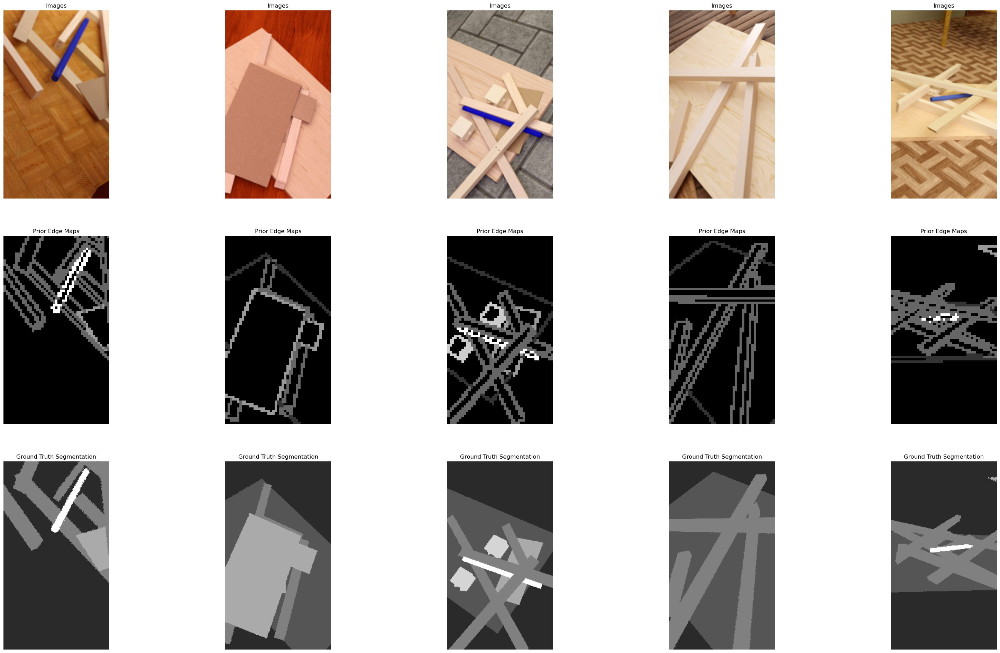

In [3]:
if Model.train_model:
    train_ds, img_count_train = DataProcessing.load_dataset(DataProcessing.key.train)
test_ds, img_count_test = DataProcessing.load_dataset(DataProcessing.key.test)

img_only_ds, img_count_img_only_ds = DataProcessing.load_dataset(DataProcessing.key.img_only)

if Model.train_model:
    for inp, out in train_ds.take(1):
        edge_detection_plots.plot_edges(images=inp['in_img'], 
                                        labels_segmentation=out['out_segmentation'],
                                        prior = inp['in_edge'],
                                        batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'])

# Define, Compile and Train Model

In [4]:
if Model.train_model:
    model = Model.get_neural_network_model(DataProcessing.input_data_cfg, DataProcessing.output_data_cfg)
    # model.summary()

    lr = Model.get_lr(img_count_train, DataProcessing.cfg['TRAIN']['BATCH_SIZE'])
    model.compile(optimizer=tf.keras.optimizers.Adam(lr),
                  loss=Model.get_loss_function(DataProcessing.output_data_cfg),
                  metrics=Model.get_metrics(DataProcessing.output_data_cfg))

    history = model.fit(train_ds, epochs=Model.cfg["EPOCHS"], validation_data=test_ds,
                        callbacks=Model.get_callbacks(f1_edge_logged=False), verbose=1)

model = Model.get_best_model_from_checkpoints()

Epoch 1/10


2023-01-26 10:28:22.377380: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100
2023-01-26 10:28:23.455901: I tensorflow/stream_executor/cuda/cuda_blas.cc:1614] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


154/154 [==============================] - 13s 61ms/step - loss: 0.8500 - categorical_accuracy: 0.7194 - val_loss: 1.3785 - val_categorical_accuracy: 0.3598
Epoch 2/10
154/154 [==============================] - 9s 56ms/step - loss: 0.6714 - categorical_accuracy: 0.7561 - val_loss: 0.9887 - val_categorical_accuracy: 0.6155
Epoch 3/10
154/154 [==============================] - 8s 55ms/step - loss: 0.6585 - categorical_accuracy: 0.7614 - val_loss: 0.8651 - val_categorical_accuracy: 0.6522
Epoch 4/10
154/154 [==============================] - 8s 55ms/step - loss: 0.6122 - categorical_accuracy: 0.7732 - val_loss: 0.7966 - val_categorical_accuracy: 0.6748
Epoch 5/10
154/154 [==============================] - 8s 55ms/step - loss: 0.5768 - categorical_accuracy: 0.7945 - val_loss: 0.7992 - val_categorical_accuracy: 0.6911
Epoch 6/10
154/154 [==============================] - 8s 55ms/step - loss: 0.5213 - categorical_accuracy: 0.8143 - val_loss: 0.9980 - val_categorical_accuracy: 0.6441
Epoch 7/

KeyError: 'Failed to format this callback filepath: "/home/david/SemesterProject/Models/edge_detection/segmentation/CKPT/ckpt-loss={val_loss:.2f}-epoch={epoch:.2f}-f1={val_f1_edge:.4f}". Reason: \'val_f1_edge\''

# Plot Results

In [5]:
if Model.train_model:
    plot_losses = ["loss"]
    plot_metrics = ["categorical_accuracy"]

    path = os.path.join(Model.Data.paths["FIGURES"], "training")

    plots.plot_training_history(history=history.history, list_of_loss_names=plot_losses,
                                list_of_metric_names=plot_metrics,
                                save=Model.cfg["SAVE"], path=path)

NameError: name 'history' is not defined

1/1 [==============================] - 0s 316ms/step


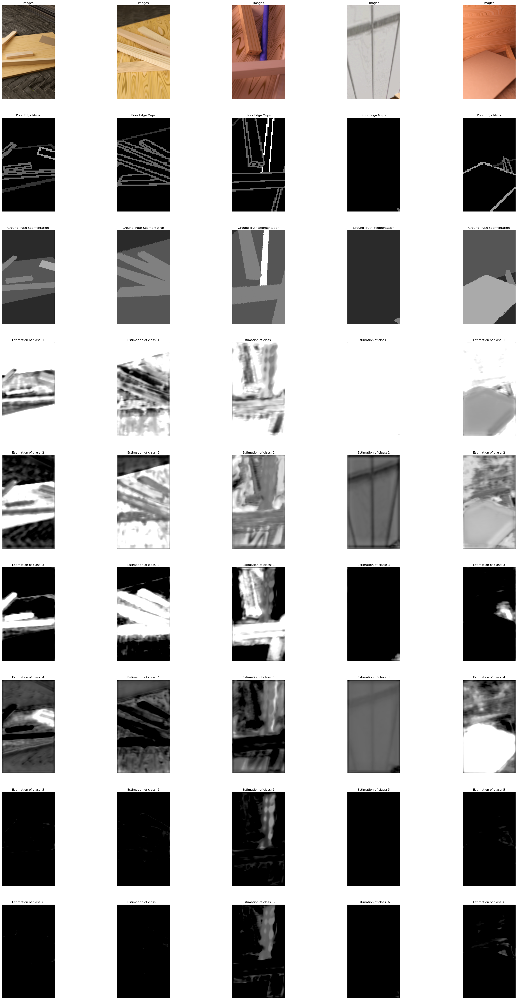

1/1 [==============================] - 0s 23ms/step


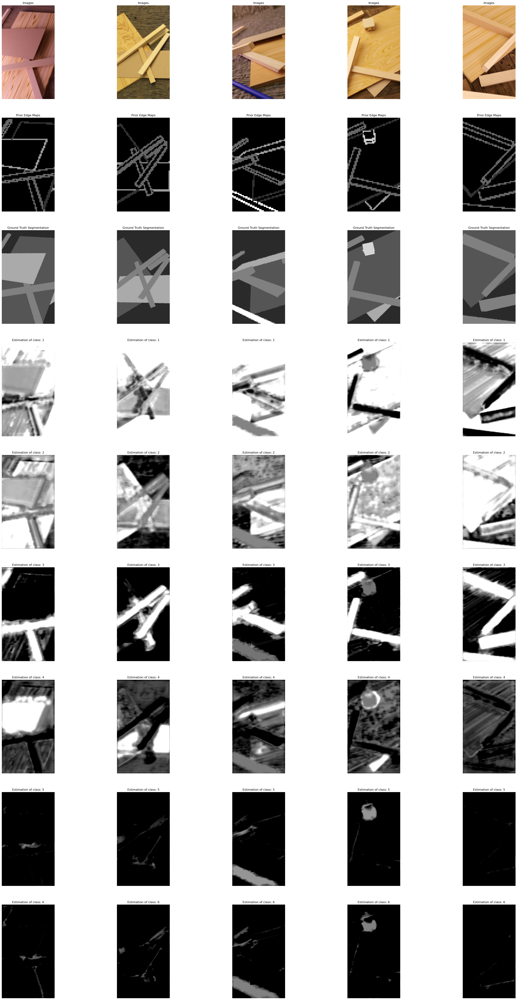

1/1 [==============================] - 0s 19ms/step


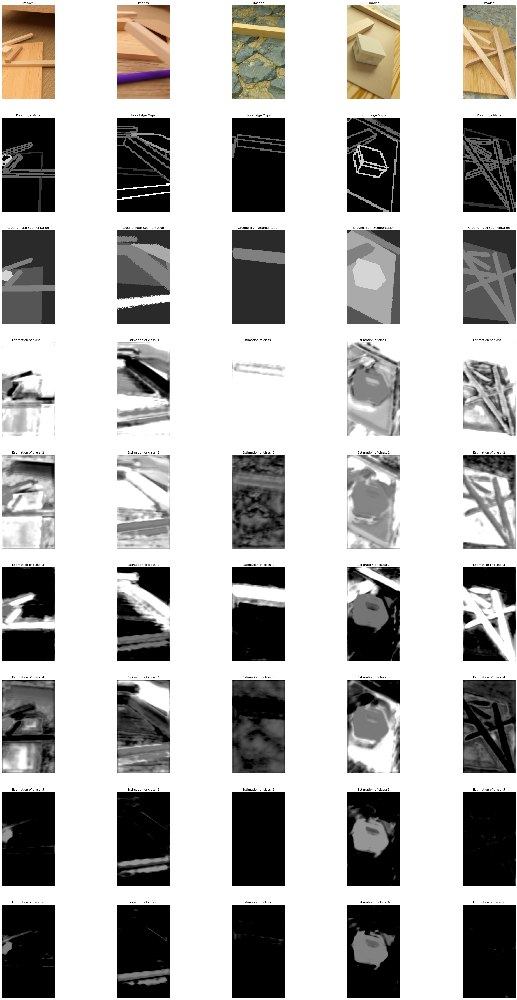

In [6]:
i = 0
for inp, out in test_ds.take(3):
    pred = model.predict(inp)
    path = os.path.join(Model.Data.paths["FIGURES"], "prediction_{}".format(i))
    edge_detection_plots.plot_edges(images=inp['in_img'],
                                    prior = inp['in_edge'],
                                    labels_segmentation=out['out_segmentation'],
                                    predictions_segmentation=pred,
                                    batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'])
    i += 1

1/1 [==============================] - 0s 35ms/step


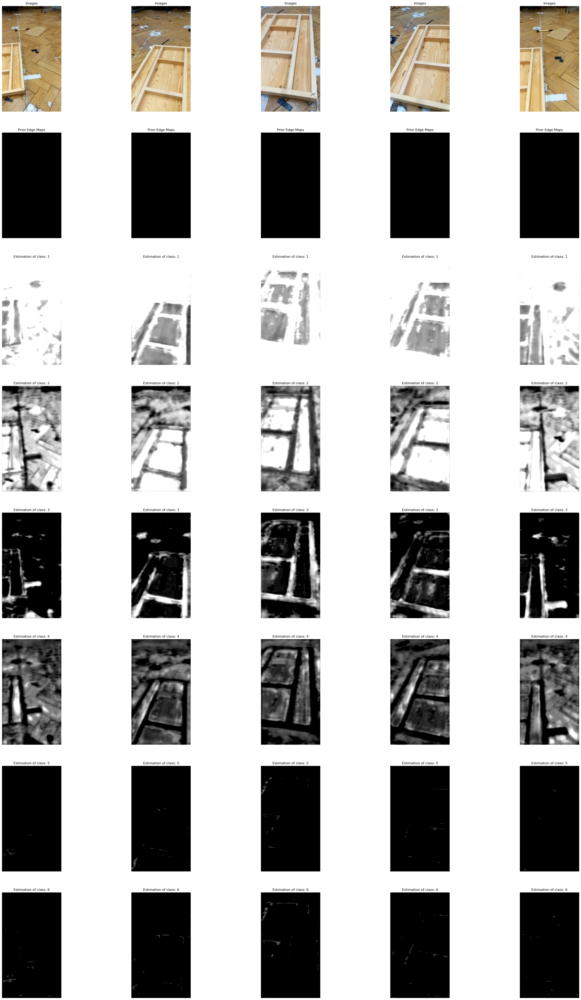

2023-01-26 10:31:03.258050: W tensorflow/core/kernels/data/cache_dataset_ops.cc:856] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


In [7]:
i = 0
for inp, out in img_only_ds.take(1):
    pred = model.predict(inp)
    path = os.path.join(Model.Data.paths["FIGURES"], "prediction_{}".format(i))
    edge_detection_plots.plot_edges(images=inp['in_img'],
                                    prior = inp['in_edge'],
                                    predictions_segmentation=pred,
                                    batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'],
                                   save=Model.cfg["SAVE"], path=path)
    i += 1

In [8]:
if Model.cfg["CONVERT_TO_TFLITE"]:
    Model.convert_model_to_tflite(model)